# 1. Importamos librerias

In [1]:
!pip install ydata-profiling
import numpy as np
import pandas as pd
#from pandas.tools.plotting import scatter_matrix
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)
pd.set_option('display.notebook_repr_html', True)
import seaborn as sns
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings('ignore')
import string
import math
import sys
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import sklearn
from IPython.core.interactiveshell import InteractiveShell
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression

InteractiveShell.ast_node_interactivity = "all"



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.8/400.8 kB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 23.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 6.2 MB/s eta 0:00:00


# 2. Generar analisis exploratorio de datos

In [2]:


df = pd.read_csv("student_salary.csv")

profile = ProfileReport(df, title="Reporte de análisis exploratorio", explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:01<00:00, 15.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Generar tabla de correlación de las variables con salary_lpa

<Figure size 1000x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlación de las variables con salary_lpa')

Text(0.5, 0, 'Coeficiente de correlación')

Text(0, 0.5, 'Variables')

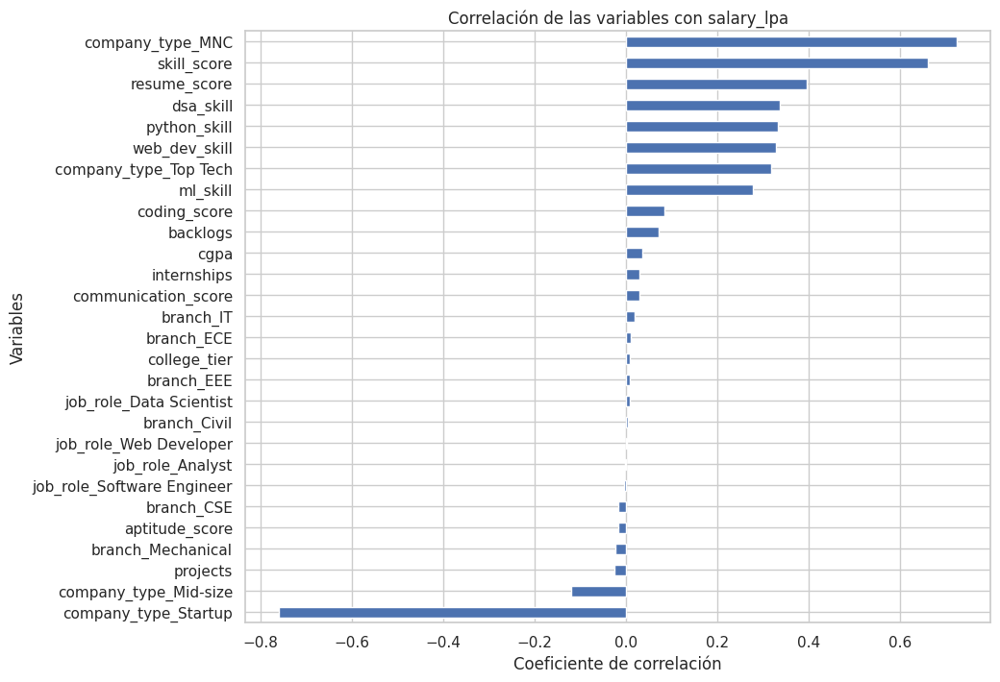

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Leer archivo
df = pd.read_csv("student_salary.csv")

# Eliminar filas con valores vacíos
df = df.dropna()

# Eliminar columnas que no aportan o que no se usarán
df = df.drop("student_id", axis=1)
df = df.drop("placed", axis=1)

# Separar variables independientes y variable objetivo
X = df.drop("salary_lpa", axis=1)
y = df["salary_lpa"]

# Columnas categóricas
categorical_features = ["branch", "company_type", "job_role"]

# Rellenar valores nulos en columnas categóricas
for feature in categorical_features:
    X[feature] = X[feature].fillna("Unknown")

# Aplicar One Hot Encoding antes de la correlación
X = pd.get_dummies(X, columns=categorical_features, dtype=int)

# Crear dataframe para correlación antes del split
df_corr = X.copy()
df_corr["salary_lpa"] = y

# Calcular matriz de correlación
matriz_corr = df_corr.corr()

# Obtener solo la correlación de salary_lpa con las demás variables
corr_salary = matriz_corr["salary_lpa"].drop("salary_lpa").sort_values(ascending=False)

# Graficar correlación con salary_lpa
plt.figure(figsize=(10, 8))
corr_salary.sort_values().plot(kind="barh")

plt.title("Correlación de las variables con salary_lpa")
plt.xlabel("Coeficiente de correlación")
plt.ylabel("Variables")
plt.show()



# 4. Preparación y normalización de datos

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Leer archivo
df = pd.read_csv("student_salary.csv")

print(df.columns)

# Eliminar filas con valores vacíos
df = df.dropna()

# Eliminar columnas que no aportan o que no se usarán
df = df.drop("student_id", axis=1)
df = df.drop("placed", axis=1)
df = df.drop("branch", axis=1)
df = df.drop("job_role", axis=1)

# Separar variables independientes y variable objetivo
X = df.drop("salary_lpa", axis=1)
y = df["salary_lpa"]



# Rellenar valores nulos en columnas categóricas

X["company_type"] = X["company_type"].fillna("Unknown")

# Aplicar One Hot Encoding antes de la correlación
X = pd.get_dummies(X, columns=["company_type"], dtype=int)

# Separamos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
)

# Columnas numéricas que sí existen en el dataset
numerical_features = ["cgpa", "coding_score", "communication_score","aptitude_score","projects", "resume_score"]

# Escalamiento
sc = StandardScaler()

X_train[numerical_features] = sc.fit_transform(X_train[numerical_features])
X_test[numerical_features] = sc.transform(X_test[numerical_features])



Index(['student_id', 'cgpa', 'branch', 'college_tier', 'python_skill', 'dsa_skill', 'ml_skill', 'web_dev_skill', 'coding_score', 'communication_score', 'aptitude_score', 'internships', 'projects', 'backlogs', 'resume_score', 'skill_score', 'placed', 'company_type', 'job_role', 'salary_lpa'], dtype='object')


In [5]:
# Convertir los datos escalados a DataFrame
X_train_processed = pd.DataFrame(
    X_train,
    columns=X_train.columns,
    index=X_train.index
)

X_test_processed = pd.DataFrame(
    X_test,
    columns=X_test.columns,
    index=X_test.index
)

# Agregar nuevamente la variable objetivo salary_lpa
train_processed = X_train_processed.copy()
train_processed["salary_lpa"] = y_train

test_processed = X_test_processed.copy()
test_processed["salary_lpa"] = y_test

# Guardar como CSV
train_processed.to_csv("train_procesado.csv", index=False)
test_processed.to_csv("test_procesado.csv", index=False)

print("Archivos generados correctamente:")
print("train_procesado.csv")
print("test_procesado.csv")




profile = ProfileReport(train_processed, title="Reporte de análisis exploratorio despues de normalización", explorative=True)

profile.to_notebook_iframe()

profile = ProfileReport(test_processed, title="Reporte de análisis exploratorio despues de normalización", explorative=True)

profile.to_notebook_iframe()



Archivos generados correctamente:
train_procesado.csv
test_procesado.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 52.71it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 62.79it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression

modelo = LinearRegression()
modelo.fit(X_train, y_train)
print("R2 en entrenamiento:", modelo.score(X_train, y_train))
print("R2 en prueba:", modelo.score(X_test, y_test))

predicciones = modelo.predict(X_test)

mse = mean_squared_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)
mae = mean_absolute_error(y_test, predicciones)

print(f"Error Cuadrático Medio (MSE): {mse}")
print(f"Error Absoluto medio (MAE): {mae}")
print(f"Coeficiente de Determinación (R2): {r2}")


LinearRegression()

R2 en entrenamiento: 0.8520220585283393
R2 en prueba: 0.8493110612183657
Error Cuadrático Medio (MSE): 43.810756728150544
Error Absoluto medio (MAE): 5.498983202298128
Coeficiente de Determinación (R2): 0.8493110612183657


In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler


# Crear modelo de red neuronal para regresión
modelo = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(1)  # una sola salida porque queremos predecir salario
])

# Compilar modelo
modelo.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

# Entrenar con épocas
history = modelo.fit(
    X_train,
    y_train,
    epochs=120,
    batch_size=10,
    validation_data=(X_test, y_test)
)

# Predicciones
predicciones = modelo.predict(X_test).flatten()

# Métricas
mse = mean_squared_error(y_test, predicciones)
mae = mean_absolute_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print(f"Error Cuadrático Medio (MSE): {mse}")
print(f"Error Absoluto Medio (MAE): {mae}")
print(f"Coeficiente de Determinación (R2): {r2}")


Epoch 1/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 1685.1456 - mae: 33.1986 - val_loss: 209.4456 - val_mae: 11.4159
Epoch 2/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 170.3424 - mae: 10.2261 - val_loss: 137.8656 - val_mae: 9.2972
Epoch 3/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 121.0504 - mae: 8.6139 - val_loss: 105.1538 - val_mae: 8.1225
Epoch 4/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 94.5354 - mae: 7.6210 - val_loss: 83.6412 - val_mae: 7.3096
Epoch 5/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 77.3452 - mae: 6.9208 - val_loss: 70.0838 - val_mae: 6.7462
Epoch 6/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 66.2084 - mae: 6.4638 - val_loss: 61.7542 - val_mae: 6.3414
Epoch 7/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 59.3723 - mae: 6.1758 - val_loss: 56.9486 - val_mae: 6.1432
Epoch 8/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 55.4401 - mae: 6.0140 - val_loss: 53.9399 - val_mae: 6.0168
Epoch 9/120
617/617 ━━

In [16]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Crear carpeta en Google Drive
!mkdir -p "/content/drive/MyDrive/salary_checkpoints"

# Ruta para guardar solo los mejores pesos del modelo
current_directory = "/content/drive/MyDrive"
checkpoint_path = current_directory + "/salary_checkpoints/best_salary_model.weights.h5"

best_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_freq="epoch",
    monitor="val_mae",
    save_best_only=True,
    mode="min",
    verbose=1
)

history = modelo.fit(
    X_train,
    y_train,
    epochs=120,
    batch_size=20,
    validation_data=(X_test, y_test),
    callbacks=[best_checkpoint]
)

modelo.compile(
    optimizer="adam",
    loss="mse",
    metrics=["mae"]

)


Epoch 1/120
275/309 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 41.2489 - mae: 5.3100
Epoch 1: val_mae improved from None to 5.61848, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5

Epoch 1: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 41.0725 - mae: 5.2972 - val_loss: 46.1499 - val_mae: 5.6185
Epoch 2/120
300/309 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.9669 - mae: 5.2901
Epoch 2: val_mae improved from 5.61848 to 5.61297, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5

Epoch 2: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 41.1965 - mae: 5.3083 - val_loss: 46.1373 - val_mae: 5.6130
Epoch 3/120
285/309 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 40.7295 - mae: 5.2811
Epoch 3: val_mae did not improve from 5.61297
30

In [17]:
import pandas as pd

predicciones = modelo.predict(X_test).flatten()

tabla_resultados = pd.DataFrame({
    "Valor real": y_test.values,
    "Valor predicho": predicciones,
    "Error absoluto": abs(y_test.values - predicciones)
})

tabla_resultados = tabla_resultados.round(2)

tabla_resultados.head(20)

49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


,Valor real,Valor predicho,Error absoluto
0,67.91,81.080002,13.17
1,88.54,80.879997,7.66
2,90.69,78.830002,11.86
3,39.37,44.889999,5.52
4,71.55,62.889999,8.66
5,86.36,73.959999,12.40
6,78.50,75.959999,2.54
7,42.77,45.750000,2.98
8,45.80,46.130001,0.33
9,46.79,44.580002,2.21


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Comparación entre valores reales y valores predichos')

Text(0.5, 0, 'Muestras')

Text(0, 0.5, 'Salario LPA')

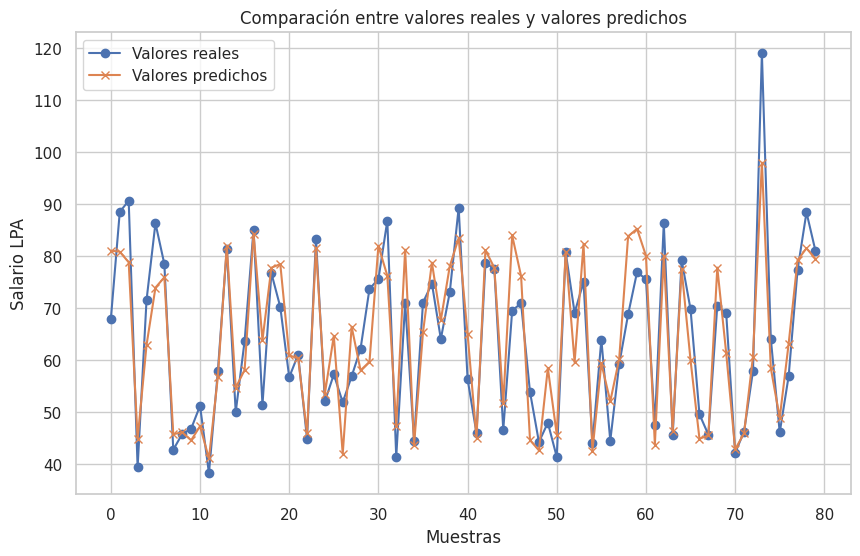

In [18]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.plot(y_test.values[:80], marker='o', label="Valores reales")
plt.plot(predicciones[:80], marker='x', label="Valores predichos")

plt.title("Comparación entre valores reales y valores predichos")
plt.xlabel("Muestras")
plt.ylabel("Salario LPA")
plt.legend()
plt.grid(True)
plt.show()

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Evolución del MAE durante el entrenamiento')

Text(0.5, 0, 'Épocas')

Text(0, 0.5, 'MAE')

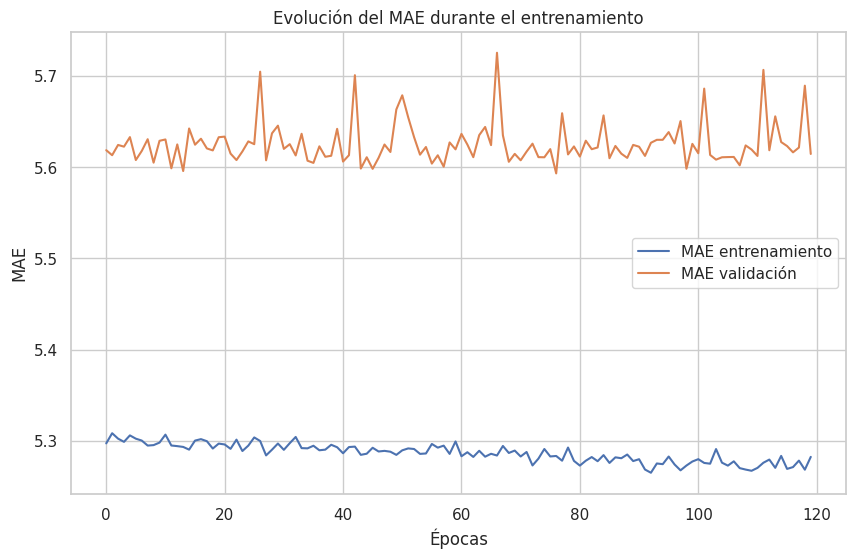

In [19]:
plt.figure(figsize=(10, 6))

plt.plot(history.history["mae"], label="MAE entrenamiento")
plt.plot(history.history["val_mae"], label="MAE validación")

plt.title("Evolución del MAE durante el entrenamiento")
plt.xlabel("Épocas")
plt.ylabel("MAE")
plt.legend()
plt.grid(True)
plt.show()

49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


<Figure size 800x600 with 0 Axes>

Text(0.5, 1.0, 'Valores reales vs predichos')

Text(0.5, 0, 'Valor real')

Text(0, 0.5, 'Valor predicho')

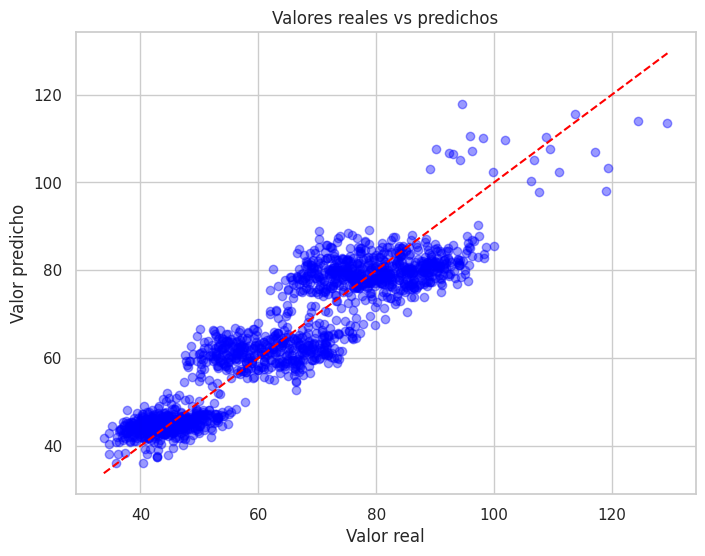

In [29]:
import matplotlib.pyplot as plt

# Generar predicciones
predicciones = modelo.predict(X_test).flatten()

plt.figure(figsize=(8, 6))

# Puntos: valor real vs valor predicho
plt.scatter(
    y_test,
    predicciones,
    color="blue",
    alpha=0.4
)

# Línea diagonal ideal
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--"
)

plt.title("Valores reales vs predichos")
plt.xlabel("Valor real")
plt.ylabel("Valor predicho")
plt.show()